**Butterflies classification Project**

In [ ]:
%%capture
!pip install tensorflow
!pip install lightning
!pip install tensorboard

In [ ]:
import pandas as pd
import numpy as np
from PIL import Image
import os

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.utils import to_categorical, load_img, img_to_array
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten, Dropout, GlobalAveragePooling2D, BatchNormalization, Conv2D, MaxPool2D

from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, precision_score, recall_score, ConfusionMatrixDisplay
from sklearn.model_selection import RandomizedSearchCV, train_test_split
from sklearn.preprocessing import OneHotEncoder, LabelEncoder
from sklearn.metrics import precision_score, recall_score, accuracy_score

import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import models
from torch.utils.data import Dataset, DataLoader
import torchvision
import torchvision.transforms as transforms
from torchvision.transforms.functional import to_tensor
from torchvision.models import resnet50, vgg16_bn, efficientnet_b0, vit_b_16, vit_l_16
from torchmetrics.classification import MulticlassAccuracy, MulticlassPrecision, MulticlassRecall

import lightning as L
from lightning.pytorch.loggers import TensorBoardLogger
from lightning.pytorch.callbacks import ModelCheckpoint

import matplotlib.pyplot as plt
import gc

Back Bone:
* Load dataset
* Preprocess data
* Data split
* Define the model
* Train Model
* Evaluate model

Define variables and import the models, dataset and classifier

In [ ]:
from src.models import ButterflyModel, ButterflyModelVIT, VisionTransformer
from src.dataset import ButterflyDataset
from src.config import NUM_CLASSES, val_transform, train_transform, vit_kwargs
from src.classifier import ButterflyClassifier
BATCH_SIZE = 128

Define a dataset class to hold data

We load the dataset, and split in train and validation

In [ ]:
df = pd.read_csv("./datasets/butterfly dataset/Training_set.csv")
# Same random state for all experiments
X_train, X_val, y_train, y_val = train_test_split(df["filename"], df["label"], test_size=0.2, random_state=42)
print(f"X and y train shape: {len(X_train)} / {len(y_train)} ")
print(f"X and y test shape: {len(X_val)} / {len(y_val)} ")

X and y train shape: 5199 / 5199 
X and y test shape: 1300 / 1300 


For code developig purposes, we define a smaller set to avoid long run time

In [ ]:
# test mode --> only execute for testing
# X_train = X_train[:BATCH_SIZE*2]
# y_train = y_train[:BATCH_SIZE*2]
# X_val = X_val[:BATCH_SIZE]
# y_val = y_val[:BATCH_SIZE]

Instantiate the class holding the dataset. Define the transforms

In [ ]:
dataset_dir = '/content/drive/My Drive/butterfly dataset/train/'
train_dataset = ButterflyDataset(df_X=X_train, df_y=y_train, img_dir=dataset_dir, transform=train_transform, num_classes=NUM_CLASSES)
val_dataset = ButterflyDataset(df_X=X_val, df_y=y_val, img_dir=dataset_dir,transform=val_transform, num_classes=NUM_CLASSES)
print(f"Train dataset: {len(train_dataset)}")
print(f"Val dataset: {len(val_dataset)}")

Train dataset: 5199
Val dataset: 1300


Display some images for code monitoring

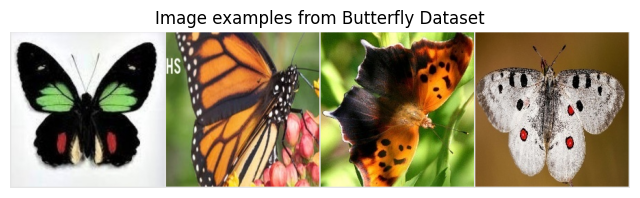

In [ ]:
# code adapted from https://uvadlc-notebooks.readthedocs.io/en/latest/tutorial_notebooks/tutorial15/Vision_Transformer.html
NUM_IMAGES = 4

# Extract images and labels from our dataset
images_example = torch.stack([val_dataset[idx][0] for idx in range(NUM_IMAGES)], dim=0)

# Generate grid of images
img_grid = torchvision.utils.make_grid(images_example, nrow=4, normalize=True, pad_value=0.9)
img_grid = img_grid.permute(1, 2, 0)

# Plot the images
plt.figure(figsize=(8, 8))
plt.title("Image examples from Butterfly Dataset")
plt.imshow(img_grid)
plt.axis('off')
plt.show()
plt.close()
#end code adapted

**Classifier mapping and main parameters**

In [ ]:
EPOCHS = 50
num_classes = NUM_CLASSES
logging_dir =  "/logs/"
os.makedirs(logging_dir, exist_ok=True)
logging_name = "butterfly_classifier"
lr = 0.001
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
# Check if a GPU is available
print(f"Using device: {device}")

classifier_mapping = {
    "resnet50": ButterflyClassifier(
        model=ButterflyModel(base_model=resnet50(weights='DEFAULT'), num_classes=num_classes),
        num_classes=num_classes,
        lr=lr
    ),
    "vgg16": ButterflyClassifier(
        model=ButterflyModel(base_model=models.vgg16(weights='DEFAULT'), num_classes=num_classes),
        num_classes=num_classes,
        lr=lr
    ) ,
    "efficientnet_b0": ButterflyClassifier(
        model=ButterflyModel(base_model=efficientnet_b0(weights='DEFAULT'), num_classes=num_classes),
        num_classes=num_classes,
        lr=lr
    ),
    "vit":ButterflyClassifier(
        model=VisionTransformer(**vit_kwargs),
        num_classes=num_classes,
        lr=lr
    ),
    "vit_b_16_pretrained_freeze_0_dropout_0.5_lr_1e-3": ButterflyClassifier(
        model=ButterflyModelVIT(base_model=vit_b_16(weights='DEFAULT'), num_classes=num_classes, vit_model_freeze=0, dropout=0.5),
        num_classes=num_classes,
        lr=lr
    ),
    "vit_b_16_pretrained_freeze_0_dropout_0.2_lr_3e-4": ButterflyClassifier(
        model=ButterflyModelVIT(base_model=vit_b_16(weights='DEFAULT'), num_classes=num_classes, vit_model_freeze=0, dropout=0.2),
        num_classes=num_classes,
        lr=3e-4
    ),
    "vit_b_16_pretrained_freeze_8_dropout_0.5_lr_1e-3": ButterflyClassifier(
        model=ButterflyModelVIT(base_model=vit_b_16(weights='DEFAULT'), num_classes=num_classes, vit_model_freeze=8),
        num_classes=num_classes,
        lr=lr
    ),
    "vit_b_16_pretrained_freeze_8_dropout_0.2_lr_3e-4": ButterflyClassifier(
        model=ButterflyModelVIT(base_model=vit_b_16(weights='DEFAULT'), num_classes=num_classes, vit_model_freeze=8, dropout=0.2),
        num_classes=num_classes,
        lr=3e-4
    ),
    "vit_b_16_pretrained_freeze_12_dropout_0.5_lr_1e-3": ButterflyClassifier(
        model=ButterflyModelVIT(base_model=vit_b_16(weights='DEFAULT'), num_classes=num_classes, vit_model_freeze=12, dropout=0.5),
        num_classes=num_classes,
        lr=lr
    ),
    "vit_b_16_pretrained_freeze_12_dropout_0.2_lr_3e-4": ButterflyClassifier(
        model=ButterflyModelVIT(base_model=vit_b_16(weights='DEFAULT'), num_classes=num_classes, vit_model_freeze=12, dropout=0.2),
        num_classes=num_classes,
        lr=3e-4
    ),
    "vit_l_16_pretrained_freeze_24_dropout_0.5_lr_1e-3": ButterflyClassifier(
        model=ButterflyModelVIT(base_model=vit_l_16(weights='DEFAULT'), num_classes=num_classes, vit_model_freeze=24),
        num_classes=num_classes,
        lr=lr
    ),
    "vit_l_16_pretrained_freeze_24_dropout_0.2_lr_3e-4": ButterflyClassifier(
        model=ButterflyModelVIT(base_model=vit_l_16(weights='DEFAULT'), num_classes=num_classes, vit_model_freeze=24, dropout=0.2),
        num_classes=num_classes,
        lr=3e-4
    ),
    "vit_l_16_pretrained_freeze_18_dropout_0.5_lr_1e-3": ButterflyClassifier(
        model=ButterflyModelVIT(base_model=vit_l_16(weights='DEFAULT'), num_classes=num_classes, vit_model_freeze=18),
        num_classes=num_classes,
        lr=lr
    ),
    "vit_l_16_pretrained_freeze_18_dropout_0.2_lr_3e-4": ButterflyClassifier(
        model=ButterflyModelVIT(base_model=vit_l_16(weights='DEFAULT'), num_classes=num_classes, vit_model_freeze=18, dropout=0.2),
        num_classes=num_classes,
        lr=3e-4
    ),
    "vit_l_16_pretrained_freeze_0_dropout_0.5_lr_1e-3": ButterflyClassifier(
        model=ButterflyModelVIT(base_model=vit_l_16(weights='DEFAULT'), num_classes=num_classes, vit_model_freeze=0, dropout=0.5),
        num_classes=num_classes,
        lr=lr
    ),
    "vit_l_16_pretrained_freeze_0_dropout_0.2_lr_3e-4": ButterflyClassifier(
        model=ButterflyModelVIT(base_model=vit_l_16(weights='DEFAULT'), num_classes=num_classes, vit_model_freeze=0, dropout=0.2),
        num_classes=num_classes,
        lr=3e-4
    ),
}

#change batch size for transformers to avoid 'out of memory'
batch_size_mapper = {
    "vit_l_16_pretrained_freeze_0_dropout_0.2_lr_3e-4": 64,
    "vit_l_16_pretrained_freeze_0_dropout_0.5_lr_1e-3": 64
}

# set remaining experiments
experiments_to_do = list(classifier_mapping.keys())

Using device: cuda


Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to /root/.cache/torch/hub/checkpoints/resnet50-11ad3fa6.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 224MB/s]
Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth
100%|██████████| 528M/528M [00:02<00:00, 201MB/s]
Downloading: "https://download.pytorch.org/models/efficientnet_b0_rwightman-7f5810bc.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b0_rwightman-7f5810bc.pth
100%|██████████| 20.5M/20.5M [00:00<00:00, 215MB/s]
Downloading: "https://download.pytorch.org/models/vit_b_16-c867db91.pth" to /root/.cache/torch/hub/checkpoints/vit_b_16-c867db91.pth
100%|██████████| 330M/330M [00:01<00:00, 223MB/s]
Downloading: "https://download.pytorch.org/models/vit_l_16-852ce7e3.pth" to /root/.cache/torch/hub/checkpoints/vit_l_16-852ce7e3.pth
100%|██████████| 1.13G/1.13G [00:05<00:00, 221MB/s]


**Training loop**

In [ ]:
for model_name, butterfly_classifier in classifier_mapping.items():
  if model_name not in experiments_to_do:
    continue
  batch_size = batch_size_mapper[model_name] if model_name in batch_size_mapper else BATCH_SIZE
  train_loader = DataLoader(train_dataset, batch_size=batch_size,num_workers=8, shuffle=True)
  val_loader = DataLoader(val_dataset, batch_size=batch_size, num_workers=8, shuffle=False)
  print(f"Model: {model_name}")

  #code adapted from https://medium.com/@rautshiska/logging-multiple-metrics-at-different-stages-with-tensorboard-and-pytorch-lightning-400509e834b2
  logger = TensorBoardLogger(logging_dir, name=f"{logging_name}_{model_name}")

  # Checkpointing and logging
  checkpoint_callback = ModelCheckpoint(
      monitor="val_loss",
      save_top_k=1,
      mode="min",
      filename="butterfly-{epoch:02d}-{val_loss:.4f}_"+f"{model_name}",
  )


  # Trainer for training without loops
  trainer = L.Trainer(
      max_epochs=EPOCHS,
      accelerator="auto",
      devices="auto",
      callbacks=[checkpoint_callback],
      check_val_every_n_epoch=1,
      log_every_n_steps=0,
      logger=logger
  )

  trainer.fit(butterfly_classifier.to(device), train_dataloaders=train_loader, val_dataloaders=val_loader)
  #end code adapted
  # code adapted from https://stackoverflow.com/a/74012970/17263606
  del butterfly_classifier
  torch.cuda.empty_cache()
  gc.collect()
  #end code adapted

**Checkpoint mapping for evaluation**

In [ ]:
import os
from pathlib import Path

checkpoint_mapper = {
    "resnet50": "/content/drive/MyDrive/Colab Notebooks/logs/butterfly_classifier_resnet50/version_17/checkpoints/butterfly-epoch=24-val_loss=0.3190_resnet50.ckpt",
    "vgg16": "/content/drive/MyDrive/Colab Notebooks/logs/butterfly_classifier_vgg16/version_11/checkpoints/butterfly-epoch=42-val_loss=0.8928_vgg16.ckpt",
    "efficientnet_b0": "/content/drive/MyDrive/Colab Notebooks/logs/butterfly_classifier_efficientnet_b0/version_10/checkpoints/butterfly-epoch=07-val_loss=0.2735_efficientnet_b0.ckpt",
    "vit": "/content/drive/MyDrive/Colab Notebooks/logs/butterfly_classifier_vit/version_9/checkpoints/butterfly-epoch=30-val_loss=1.4976_vit.ckpt",
    "vit_b_16_pretrained_freeze_0_dropout_0.2_lr_3e-4": "/content/drive/MyDrive/Colab Notebooks/logs/butterfly_classifier_vit_b_16_pretrained_freeze_0_dropout_0.2_lr_3e-4/version_0/checkpoints/butterfly-epoch=15-val_loss=0.3492_vit_b_16_pretrained_freeze_0_dropout_0.2_lr_3e-4.ckpt",
    "vit_b_16_pretrained_freeze_0_dropout_0.5_lr_1e-3": "/content/drive/MyDrive/Colab Notebooks/logs/butterfly_classifier_vit_b_16_pretrained_freeze_0_dropout_0.5_lr_1e-3/version_1/checkpoints/butterfly-epoch=48-val_loss=2.5661_vit_b_16_pretrained_freeze_0_dropout_0.5_lr_1e-3.ckpt",
    "vit_b_16_pretrained_freeze_8_dropout_0.2_lr_3e-4": "/content/drive/MyDrive/Colab Notebooks/logs/butterfly_classifier_vit_b_16_pretrained_freeze_8_dropout_0.2_lr_3e-4/version_1/checkpoints/butterfly-epoch=13-val_loss=0.2740_vit_b_16_pretrained_freeze_8_dropout_0.2_lr_3e-4.ckpt",
    "vit_b_16_pretrained_freeze_8_dropout_0.5_lr_1e-3": "/content/drive/MyDrive/Colab Notebooks/logs/butterfly_classifier_vit_b_16_pretrained_freeze_8_dropout_0.5_lr_1e-3/version_2/checkpoints/butterfly-epoch=25-val_loss=0.4125_vit_b_16_pretrained_freeze_8_dropout_0.5_lr_1e-3.ckpt",
    "vit_b_16_pretrained_freeze_12_dropout_0.2_lr_3e-4": "/content/drive/MyDrive/Colab Notebooks/logs/butterfly_classifier_vit_b_16_pretrained_freeze_12_dropout_0.2_lr_3e-4/version_1/checkpoints/butterfly-epoch=36-val_loss=0.3499_vit_b_16_pretrained_freeze_12_dropout_0.2_lr_3e-4.ckpt",
    "vit_b_16_pretrained_freeze_12_dropout_0.5_lr_1e-3": "/content/drive/MyDrive/Colab Notebooks/logs/butterfly_classifier_vit_b_16_pretrained_freeze_12_dropout_0.5_lr_1e-3/version_1/checkpoints/butterfly-epoch=46-val_loss=1.0848_vit_b_16_pretrained_freeze_12_dropout_0.5_lr_1e-3.ckpt",
    "vit_l_16_pretrained_freeze_0_dropout_0.2_lr_3e-4": "/content/drive/MyDrive/Colab Notebooks/logs/butterfly_classifier_vit_l_16_pretrained_freeze_0_dropout_0.2_lr_3e-4/version_3/checkpoints/butterfly-epoch=19-val_loss=0.3663_vit_l_16_pretrained_freeze_0_dropout_0.2_lr_3e-4.ckpt",
    "vit_l_16_pretrained_freeze_0_dropout_0.5_lr_1e-3": "/content/drive/MyDrive/Colab Notebooks/logs/butterfly_classifier_vit_l_16_pretrained_freeze_0_dropout_0.5_lr_1e-3/version_5/checkpoints/butterfly-epoch=04-val_loss=4.3170_vit_l_16_pretrained_freeze_0_dropout_0.5_lr_1e-3.ckpt",
    "vit_l_16_pretrained_freeze_18_dropout_0.2_lr_3e-4": "/content/drive/MyDrive/Colab Notebooks/logs/butterfly_classifier_vit_l_16_pretrained_freeze_18_dropout_0.2_lr_3e-4/version_1/checkpoints/butterfly-epoch=09-val_loss=0.2767_vit_l_16_pretrained_freeze_18_dropout_0.2_lr_3e-4.ckpt",
    "vit_l_16_pretrained_freeze_18_dropout_0.5_lr_1e-3": "/content/drive/MyDrive/Colab Notebooks/logs/butterfly_classifier_vit_l_16_pretrained_freeze_18_dropout_0.5_lr_1e-3/version_0/checkpoints/butterfly-epoch=16-val_loss=0.4371_vit_l_16_pretrained_freeze_18_dropout_0.5_lr_1e-3.ckpt",
    "vit_l_16_pretrained_freeze_24_dropout_0.2_lr_3e-4": "/content/drive/MyDrive/Colab Notebooks/logs/butterfly_classifier_vit_l_16_pretrained_freeze_24_dropout_0.2_lr_3e-4/version_1/checkpoints/butterfly-epoch=35-val_loss=0.2681_vit_l_16_pretrained_freeze_24_dropout_0.2_lr_3e-4.ckpt",
    "vit_l_16_pretrained_freeze_24_dropout_0.5_lr_1e-3": "/content/drive/MyDrive/Colab Notebooks/logs/butterfly_classifier_vit_l_16_pretrained_freeze_24_dropout_0.5_lr_1e-3/version_7/checkpoints/butterfly-epoch=26-val_loss=0.2640_vit_l_16_pretrained_freeze_24_dropout_0.5_lr_1e-3.ckpt",
}

# Get the checkpoint paths
def get_checkpoint_path(checkpoint_value):
    if checkpoint_value.endswith('.ckpt'):
        return checkpoint_value
    checkpoint_dir = os.path.join(checkpoint_value, "checkpoints")
    ckpt_files = [f for f in os.listdir(checkpoint_dir) if f.endswith('.ckpt')]
    if len(ckpt_files) == 1:
        return os.path.join(checkpoint_dir, ckpt_files[0])
    else:
        raise ValueError(f"expected file  .ckpt en {checkpoint_dir}, butfound  {len(ckpt_files)}")

# Parser the parameters of the file
def parse_model_params(model_key):
    parts = model_key.split('_')
    base_model = None
    freeze = 0
    dropout = 0.5

    if "resnet50" in model_key:
        base_model = resnet50(weights='DEFAULT')
    elif "vgg16" in model_key:
        base_model = models.vgg16(weights='DEFAULT')
    elif "efficientnet_b0" in model_key:
        base_model = efficientnet_b0(weights='DEFAULT')
    elif "vit_b_16" in model_key:
        base_model = vit_b_16(weights='DEFAULT')
    elif "vit_l_16" in model_key:
        base_model = vit_l_16(weights='DEFAULT')
    elif "vit" in model_key:
        return VisionTransformer(**vit_kwargs), 0, 0.0
    for i,part in enumerate(parts):
        if "freeze" in part:
            freeze = int(parts[i+1].replace("freeze", ""))
        if "dropout" in part:
            dropout = float(parts[i+1].replace("dropout", ""))

    return base_model, freeze, dropout

**Evaluation loop**

In [ ]:
from lightning.pytorch.loggers import TensorBoardLogger
from lightning.pytorch.callbacks import ModelCheckpoint
import lightning.pytorch as L
val_loader = DataLoader(val_dataset, batch_size=128, num_workers=8, shuffle=False)

for model_key, checkpoint_path in checkpoint_mapper.items():
    checkpoint_path = get_checkpoint_path(checkpoint_path)
    base_model, freeze, dropout = parse_model_params(model_key)

    if "vit" in model_key and not ("vit_b_16" in model_key or "vit_l_16" in model_key):
        butterfly_classifier = ButterflyClassifier.load_from_checkpoint(
            checkpoint_path,
            model=base_model,
            num_classes=num_classes
        )
    else:
       butterfly_classifier = ButterflyClassifier.load_from_checkpoint(
            checkpoint_path,
            model=ButterflyModelVIT(base_model=base_model, num_classes=num_classes, vit_model_freeze=freeze, dropout=dropout) if "vit_" in model_key else ButterflyModel(base_model=base_model, num_classes=num_classes),
            num_classes=num_classes
        )

    logger = TensorBoardLogger(logging_dir, name=f"{logging_name}_{model_key}", version="")  #model_name -> model_key

    #code adapted from https://medium.com/@rautshiska/logging-multiple-metrics-at-different-stages-with-tensorboard-and-pytorch-lightning-400509e834b2
    trainer = L.Trainer(
        accelerator="auto",
        devices="auto",
        logger=False,
        callbacks=[],
        enable_checkpointing=False,
        enable_model_summary=False,
        inference_mode = True,
        default_root_dir= None
    )

    print(f"Model: {model_key}")
    trainer.validate(butterfly_classifier.to(device), dataloaders=val_loader)
    #end code adapted

INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Model: resnet50


Validation: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃      Validate metric      ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│       val_accuracy        │     0.926153838634491     │
│         val_loss          │    0.3190414309501648     │
│       val_precision       │    0.9344624876976013     │
│        val_recall         │     0.926153838634491     │
└───────────────────────────┴───────────────────────────┘

INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Model: vgg16


Validation: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃      Validate metric      ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│       val_accuracy        │    0.7661538124084473     │
│         val_loss          │    0.8927797079086304     │
│       val_precision       │     0.786761999130249     │
│        val_recall         │    0.7661538124084473     │
└───────────────────────────┴───────────────────────────┘

INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Model: efficientnet_b0


Validation: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃      Validate metric      ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│       val_accuracy        │    0.9346153736114502     │
│         val_loss          │    0.27346915006637573    │
│       val_precision       │    0.9383401274681091     │
│        val_recall         │    0.9346153736114502     │
└───────────────────────────┴───────────────────────────┘

INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Model: vit


Validation: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃      Validate metric      ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│       val_accuracy        │    0.5938461422920227     │
│         val_loss          │    1.4975817203521729     │
│       val_precision       │    0.6326452493667603     │
│        val_recall         │    0.5938461422920227     │
└───────────────────────────┴───────────────────────────┘

INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Model: vit_b_16_pretrained_freeze_0_dropout_0.2_lr_3e-4


Validation: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃      Validate metric      ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│       val_accuracy        │    0.9161539077758789     │
│         val_loss          │    0.34923091530799866    │
│       val_precision       │    0.9228724241256714     │
│        val_recall         │    0.9161539077758789     │
└───────────────────────────┴───────────────────────────┘

INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Model: vit_b_16_pretrained_freeze_0_dropout_0.5_lr_1e-3


Validation: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃      Validate metric      ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│       val_accuracy        │    0.29384616017341614    │
│         val_loss          │     2.566073179244995     │
│       val_precision       │    0.27966439723968506    │
│        val_recall         │    0.29384616017341614    │
└───────────────────────────┴───────────────────────────┘

INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Model: vit_b_16_pretrained_freeze_8_dropout_0.2_lr_3e-4


Validation: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃      Validate metric      ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│       val_accuracy        │    0.9307692050933838     │
│         val_loss          │    0.27398762106895447    │
│       val_precision       │    0.9361582398414612     │
│        val_recall         │    0.9307692050933838     │
└───────────────────────────┴───────────────────────────┘

INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Model: vit_b_16_pretrained_freeze_8_dropout_0.5_lr_1e-3


Validation: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃      Validate metric      ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│       val_accuracy        │    0.8930768966674805     │
│         val_loss          │    0.4125216007232666     │
│       val_precision       │    0.8985478281974792     │
│        val_recall         │    0.8930768966674805     │
└───────────────────────────┴───────────────────────────┘

INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Model: vit_b_16_pretrained_freeze_12_dropout_0.2_lr_3e-4


Validation: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃      Validate metric      ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│       val_accuracy        │    0.9046153426170349     │
│         val_loss          │    0.34992870688438416    │
│       val_precision       │    0.9086147546768188     │
│        val_recall         │    0.9046153426170349     │
└───────────────────────────┴───────────────────────────┘

INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Model: vit_b_16_pretrained_freeze_12_dropout_0.5_lr_1e-3


Validation: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃      Validate metric      ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│       val_accuracy        │    0.6784615516662598     │
│         val_loss          │    1.0847747325897217     │
│       val_precision       │    0.6937205791473389     │
│        val_recall         │    0.6784615516662598     │
└───────────────────────────┴───────────────────────────┘

INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Model: vit_l_16_pretrained_freeze_0_dropout_0.2_lr_3e-4


Validation: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃      Validate metric      ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│       val_accuracy        │    0.8984615206718445     │
│         val_loss          │    0.3663162589073181     │
│       val_precision       │    0.9053505659103394     │
│        val_recall         │    0.8984615206718445     │
└───────────────────────────┴───────────────────────────┘

INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Model: vit_l_16_pretrained_freeze_0_dropout_0.5_lr_1e-3


Validation: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃      Validate metric      ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│       val_accuracy        │   0.026923077180981636    │
│         val_loss          │     4.317046165466309     │
│       val_precision       │   0.0007248520851135254   │
│        val_recall         │   0.026923077180981636    │
└───────────────────────────┴───────────────────────────┘

INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Model: vit_l_16_pretrained_freeze_18_dropout_0.2_lr_3e-4


Validation: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃      Validate metric      ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│       val_accuracy        │    0.9307692050933838     │
│         val_loss          │    0.2766941487789154     │
│       val_precision       │     0.935879111289978     │
│        val_recall         │    0.9307692050933838     │
└───────────────────────────┴───────────────────────────┘

INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Model: vit_l_16_pretrained_freeze_18_dropout_0.5_lr_1e-3


Validation: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃      Validate metric      ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│       val_accuracy        │    0.9276922941207886     │
│         val_loss          │    0.2229357659816742     │
│       val_precision       │    0.9387229084968567     │
│        val_recall         │    0.9276922941207886     │
└───────────────────────────┴───────────────────────────┘

INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Model: vit_l_16_pretrained_freeze_24_dropout_0.2_lr_3e-4


Validation: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃      Validate metric      ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│       val_accuracy        │    0.9330769181251526     │
│         val_loss          │    0.2681412100791931     │
│       val_precision       │    0.9348930716514587     │
│        val_recall         │    0.9330769181251526     │
└───────────────────────────┴───────────────────────────┘

INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Model: vit_l_16_pretrained_freeze_24_dropout_0.5_lr_1e-3


Validation: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃      Validate metric      ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│       val_accuracy        │    0.9323077201843262     │
│         val_loss          │    0.2640273869037628     │
│       val_precision       │    0.9362154006958008     │
│        val_recall         │    0.9323077201843262     │
└───────────────────────────┴───────────────────────────┘

**Loss-Acc graphs train-val**

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def generate_plots(train_loss_values, val_loss_values, train_acc_values, val_acc_values, model_name):
    epochs = list(range(1, len(train_loss_values) + 1))

    # smooth the data
    def smooth_data(values, window_size=5):
        return np.convolve(values, np.ones(window_size) / window_size, mode='valid')

    window_size = 5
    smoothed_train_loss = smooth_data(train_loss_values, window_size)
    smoothed_val_loss = smooth_data(val_loss_values, window_size)
    smoothed_train_acc = smooth_data(train_acc_values, window_size)
    smoothed_val_acc = smooth_data(val_acc_values, window_size)

    smoothed_epochs = epochs[:len(smoothed_train_loss)]

    # min and max to get the proper size of the plot
    min_loss_smoothed = min(min(smoothed_train_loss), min(smoothed_val_loss))
    max_loss_smoothed = max(max(smoothed_train_loss), max(smoothed_val_loss))
    min_acc_smoothed = min(min(smoothed_train_acc), min(smoothed_val_acc))
    max_acc_smoothed = max(max(smoothed_train_acc), max(smoothed_val_acc))


    loss_margin = (max_loss_smoothed - min_loss_smoothed) * 0.1
    acc_margin = (max_acc_smoothed - min_acc_smoothed) * 0.1

    plt.figure(figsize=(16, 6))
    plt.subplot(1, 2, 1)
    plt.plot(epochs, train_loss_values, label="Train Loss (Raw)", alpha=0.5, linestyle="--")
    plt.plot(epochs, val_loss_values, label="Validation Loss (Raw)", alpha=0.5, linestyle="--")
    plt.plot(smoothed_epochs, smoothed_train_loss, label="Train Loss (Smoothed)", linewidth=2)
    plt.plot(smoothed_epochs, smoothed_val_loss, label="Validation Loss (Smoothed)", linewidth=2)
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.title(f"Train vs Validation Loss (Smoothed and Raw)")
    plt.ylim(max(min_loss_smoothed - loss_margin, 0), max_loss_smoothed + loss_margin)
    plt.legend()
    plt.grid(True)

    plt.subplot(1, 2, 2)
    plt.plot(epochs, train_acc_values, label="Train Accuracy (Raw)", alpha=0.5, linestyle="--")
    plt.plot(epochs, val_acc_values, label="Validation Accuracy (Raw)", alpha=0.5, linestyle="--")
    plt.plot(smoothed_epochs, smoothed_train_acc, label="Train Accuracy (Smoothed)", linewidth=2)
    plt.plot(smoothed_epochs, smoothed_val_acc, label="Validation Accuracy (Smoothed)", linewidth=2)
    plt.xlabel("Epochs")
    plt.ylabel("Accuracy")
    plt.title(f"Train vs Validation Accuracy (Smoothed and Raw)")
    plt.ylim(max(min_acc_smoothed - acc_margin, 0), min(max_acc_smoothed + acc_margin, 1))
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

**Plotting logs**

Model: resnet50 Max val acc 0.9330768585205078 Max precision 0.9378082752227783 Max recall 0.9330768585205078 Min loss 0.31898558139801025


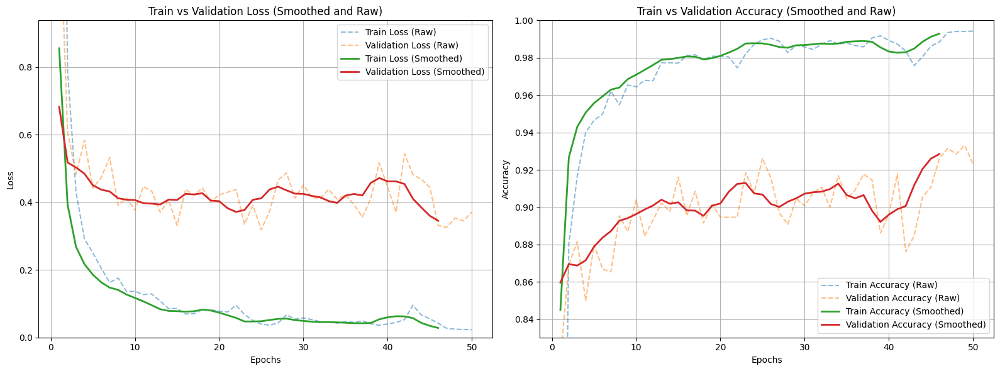

Model: vgg16 Max val acc 0.7730769515037537 Max precision 0.7883293628692627 Max recall 0.7730769515037537 Min loss 0.8927850723266602


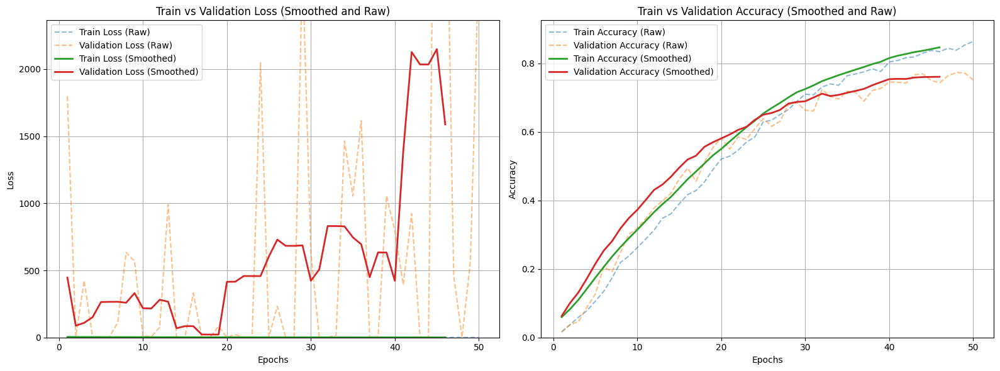

Model: efficientnet_b0 Max val acc 0.9353846311569214 Max precision 0.9385577440261841 Max recall 0.9353846311569214 Min loss 0.2734571397304535


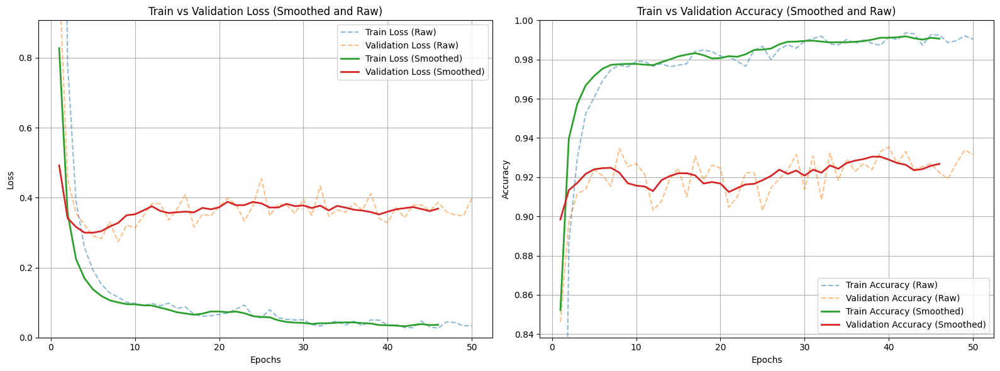

Model: vit Max val acc 0.6192307472229004 Max precision 0.6390384435653687 Max recall 0.6192307472229004 Min loss 1.4975816011428833


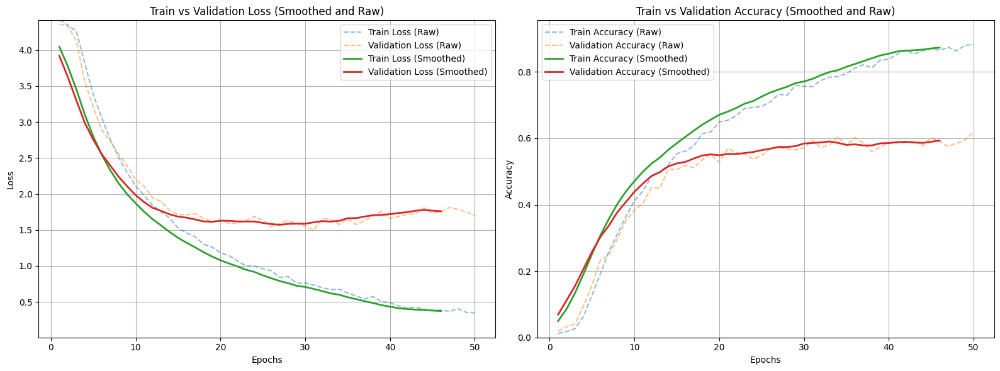

Model: vit_b_16_pretrained_freeze_0_dropout_0.5_lr_1e-3 Max val acc 0.29384616017341614 Max precision 0.27966439723968506 Max recall 0.29384616017341614 Min loss 2.566073417663574


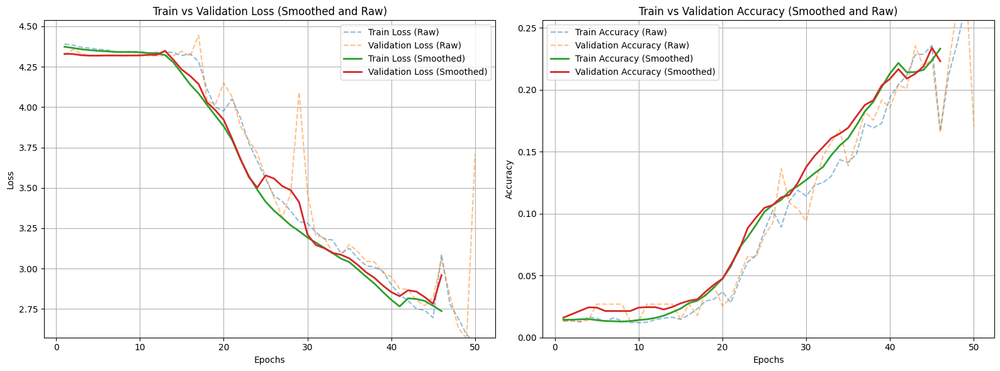

Model: vit_b_16_pretrained_freeze_0_dropout_0.2_lr_3e-4 Max val acc 0.9161539077758789 Max precision 0.9228724241256714 Max recall 0.9161539077758789 Min loss 0.34923088550567627


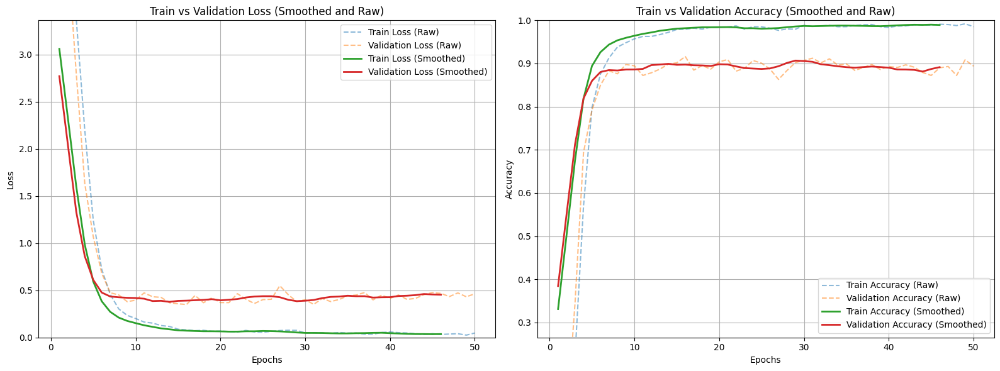

Model: vit_b_16_pretrained_freeze_8_dropout_0.2_lr_3e-4 Max val acc 0.933846116065979 Max precision 0.9378119111061096 Max recall 0.933846116065979 Min loss 0.2739875614643097


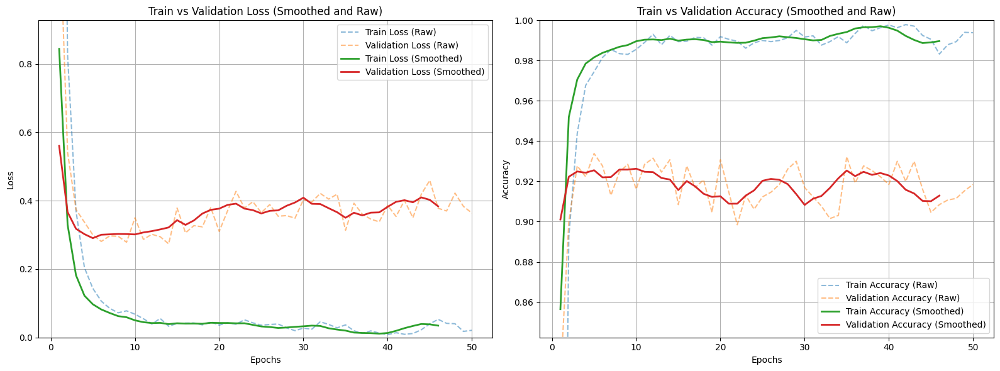

Model: vit_b_16_pretrained_freeze_8_dropout_0.5_lr_1e-3 Max val acc 0.8930769562721252 Max precision 0.9021390676498413 Max recall 0.8930769562721252 Min loss 0.4125218391418457


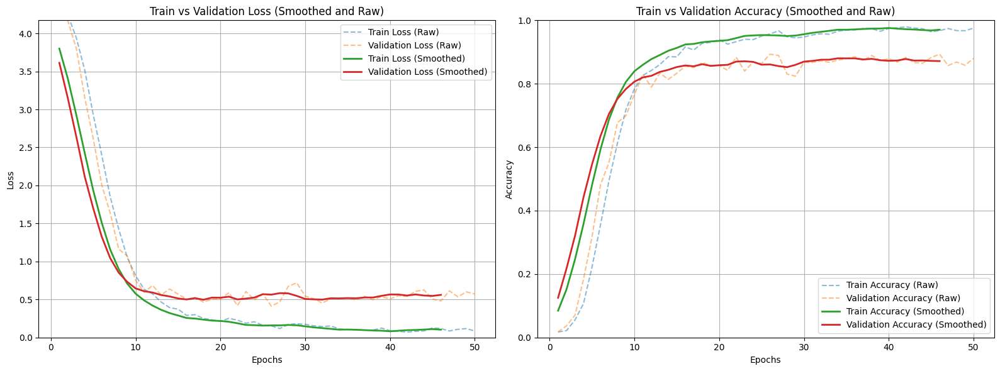

Model: vit_b_16_pretrained_freeze_12_dropout_0.5_lr_1e-3 Max val acc 0.6907691955566406 Max precision 0.7106847763061523 Max recall 0.6907691955566406 Min loss 1.0847747325897217


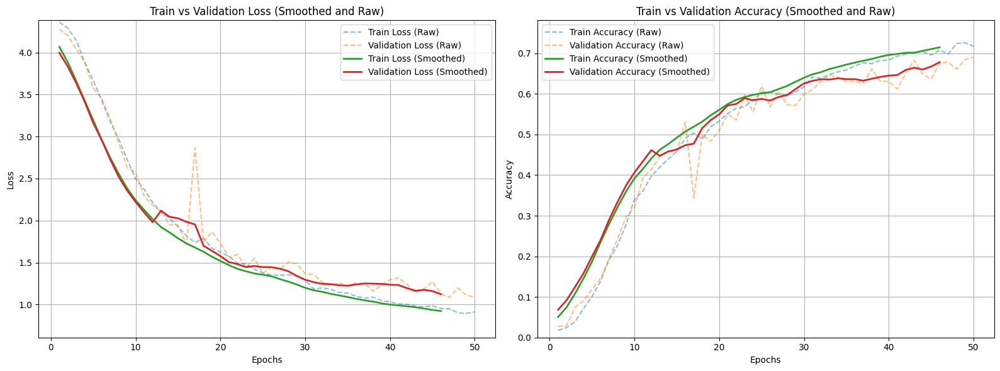

Model: vit_b_16_pretrained_freeze_12_dropout_0.2_lr_3e-4 Max val acc 0.9084615111351013 Max precision 0.9141408205032349 Max recall 0.9084615111351013 Min loss 0.34992873668670654


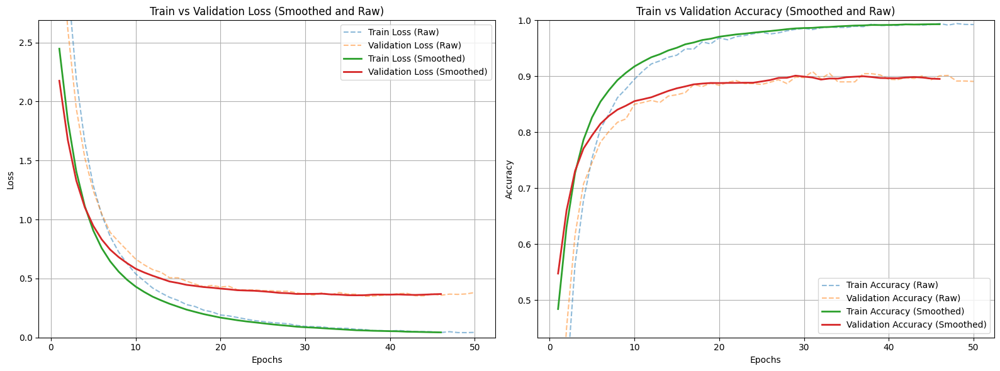

Model: vit_l_16_pretrained_freeze_0_dropout_0.2_lr_3e-4 Max val acc 0.8999999761581421 Max precision 0.9128440618515015 Max recall 0.8999999761581421 Min loss 0.36631619930267334


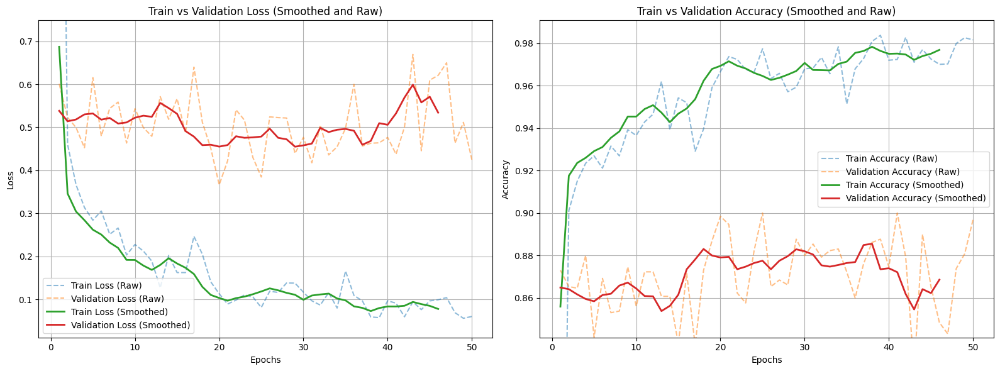

Model: vit_l_16_pretrained_freeze_0_dropout_0.5_lr_1e-3 Max val acc 0.026923077180981636 Max precision 0.0007248520851135254 Max recall 0.026923077180981636 Min loss 4.31704568862915


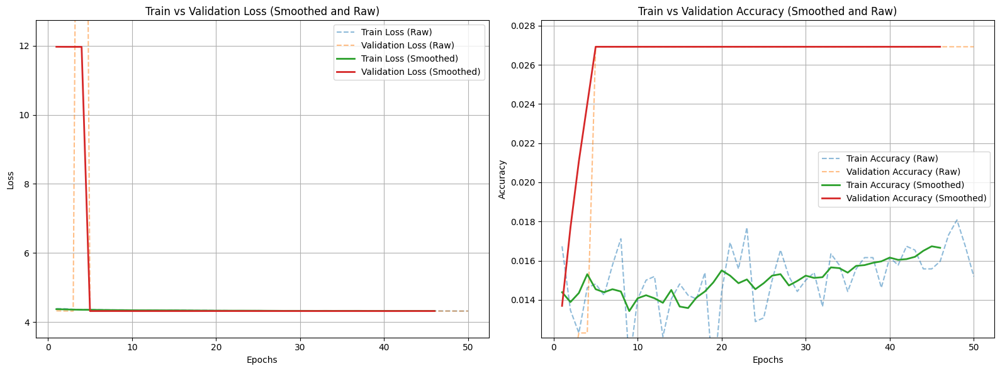

Model: vit_l_16_pretrained_freeze_18_dropout_0.2_lr_3e-4 Max val acc 0.9330768585205078 Max precision 0.9376556277275085 Max recall 0.9330768585205078 Min loss 0.276694118976593


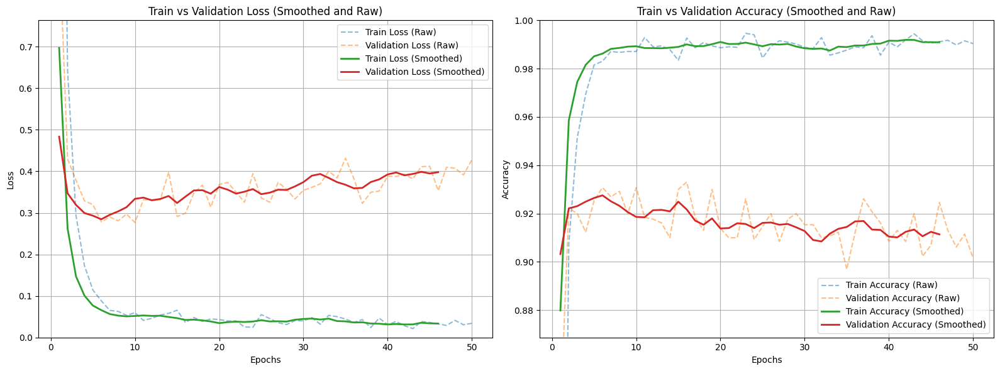

Model: vit_l_16_pretrained_freeze_18_dropout_0.5_lr_1e-3 Max val acc 0.8723076581954956 Max precision 0.8797413110733032 Max recall 0.8723076581954956 Min loss 0.4370603561401367


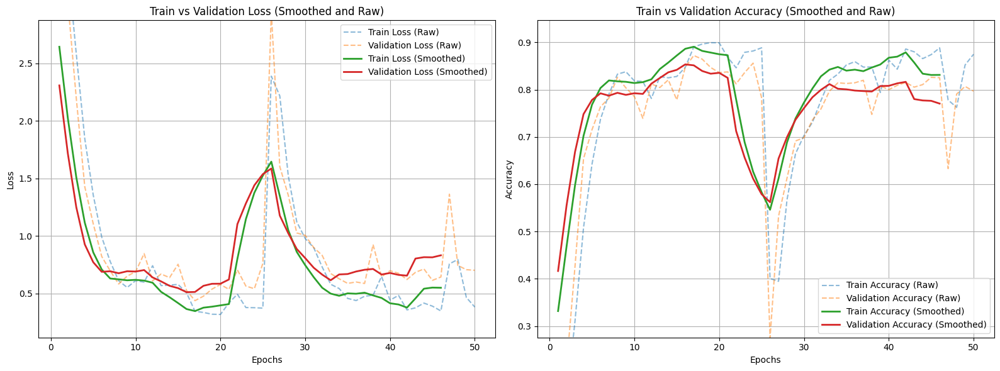

Model: vit_l_16_pretrained_freeze_24_dropout_0.2_lr_3e-4 Max val acc 0.9330769181251526 Max precision 0.9348930716514587 Max recall 0.9330769181251526 Min loss 0.2681412100791931


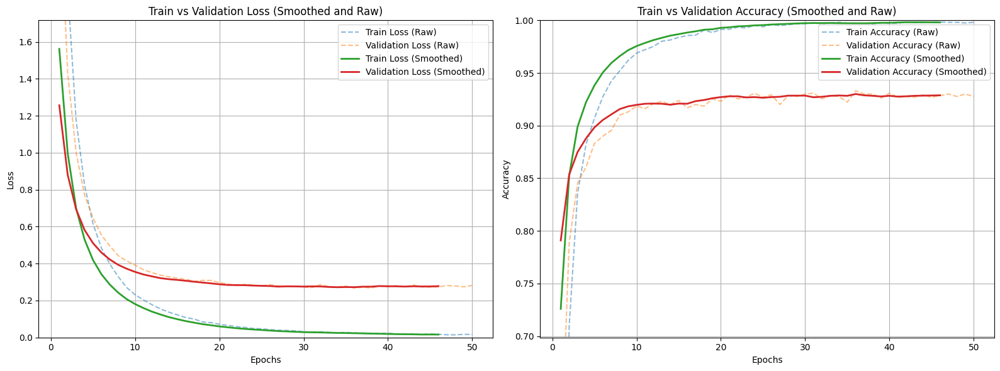

Model: vit_l_16_pretrained_freeze_24_dropout_0.5_lr_1e-3 Max val acc 0.9323077201843262 Max precision 0.9367731809616089 Max recall 0.9323077201843262 Min loss 0.26402747631073


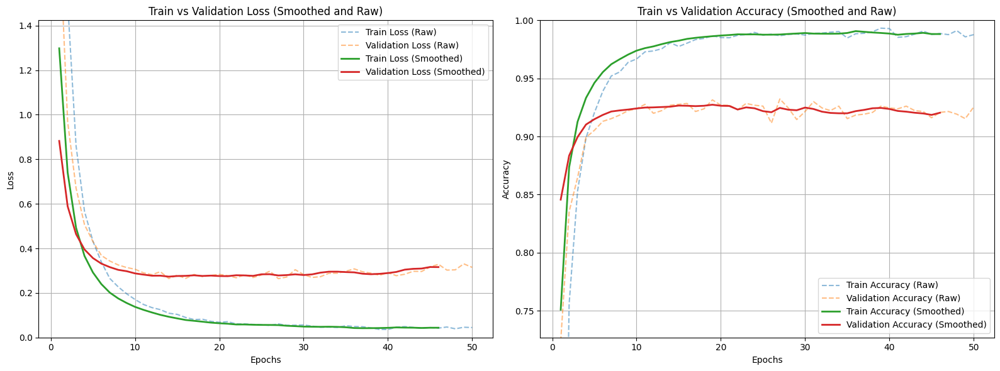

In [ ]:
import os
import matplotlib.pyplot as plt
from tensorboard.backend.event_processing import event_accumulator

events_mapper = {
    "resnet50": "/content/drive/MyDrive/Colab Notebooks/logs/butterfly_classifier_resnet50/version_17/events.out.tfevents.1741968321.97c76a6955fd.623.0",
    "vgg16": "/content/drive/MyDrive/Colab Notebooks/logs/butterfly_classifier_vgg16/version_11/events.out.tfevents.1741969264.97c76a6955fd.623.1",
    "efficientnet_b0": "/content/drive/MyDrive/Colab Notebooks/logs/butterfly_classifier_efficientnet_b0/version_10/events.out.tfevents.1741970094.97c76a6955fd.623.2",
    "vit" : "/content/drive/MyDrive/Colab Notebooks/logs/butterfly_classifier_vit/version_9/events.out.tfevents.1741970770.97c76a6955fd.623.3",
    "vit_b_16_pretrained_freeze_0_dropout_0.5_lr_1e-3" : "/content/drive/MyDrive/Colab Notebooks/logs/butterfly_classifier_vit_b_16_pretrained_freeze_0_dropout_0.5_lr_1e-3/version_1/events.out.tfevents.1741971440.97c76a6955fd.623.4",
    "vit_b_16_pretrained_freeze_0_dropout_0.2_lr_3e-4": "/content/drive/MyDrive/Colab Notebooks/logs/butterfly_classifier_vit_b_16_pretrained_freeze_0_dropout_0.2_lr_3e-4/version_0/events.out.tfevents.1741973833.97c76a6955fd.623.5",
    "vit_b_16_pretrained_freeze_8_dropout_0.2_lr_3e-4" : "/content/drive/MyDrive/Colab Notebooks/logs/butterfly_classifier_vit_b_16_pretrained_freeze_8_dropout_0.2_lr_3e-4/version_1/events.out.tfevents.1741978104.97c76a6955fd.623.7",
    "vit_b_16_pretrained_freeze_8_dropout_0.5_lr_1e-3" : "/content/drive/MyDrive/Colab Notebooks/logs/butterfly_classifier_vit_b_16_pretrained_freeze_8_dropout_0.5_lr_1e-3/version_2/events.out.tfevents.1741976135.97c76a6955fd.623.6",
    "vit_b_16_pretrained_freeze_12_dropout_0.5_lr_1e-3" : "/content/drive/MyDrive/Colab Notebooks/logs/butterfly_classifier_vit_b_16_pretrained_freeze_12_dropout_0.5_lr_1e-3/version_1/events.out.tfevents.1741980042.97c76a6955fd.623.8",
    "vit_b_16_pretrained_freeze_12_dropout_0.2_lr_3e-4" : "/content/drive/MyDrive/Colab Notebooks/logs/butterfly_classifier_vit_b_16_pretrained_freeze_12_dropout_0.2_lr_3e-4/version_1/events.out.tfevents.1741981859.97c76a6955fd.623.9",
    "vit_l_16_pretrained_freeze_0_dropout_0.2_lr_3e-4" : "/content/drive/MyDrive/Colab Notebooks/logs/butterfly_classifier_vit_l_16_pretrained_freeze_0_dropout_0.2_lr_3e-4/version_3/events.out.tfevents.1742011672.97c76a6955fd.623.15",
    "vit_l_16_pretrained_freeze_0_dropout_0.5_lr_1e-3" : "/content/drive/MyDrive/Colab Notebooks/logs/butterfly_classifier_vit_l_16_pretrained_freeze_0_dropout_0.5_lr_1e-3/version_5/events.out.tfevents.1742004778.97c76a6955fd.623.14",
    "vit_l_16_pretrained_freeze_18_dropout_0.2_lr_3e-4" : "/content/drive/MyDrive/Colab Notebooks/logs/butterfly_classifier_vit_l_16_pretrained_freeze_18_dropout_0.2_lr_3e-4/version_1/events.out.tfevents.1741999328.97c76a6955fd.623.13",
    "vit_l_16_pretrained_freeze_18_dropout_0.5_lr_1e-3" : "/content/drive/MyDrive/Colab Notebooks/logs/butterfly_classifier_vit_l_16_pretrained_freeze_18_dropout_0.5_lr_1e-3/version_0/events.out.tfevents.1740565712.7c4eb17624dd.2035.3",
    "vit_l_16_pretrained_freeze_24_dropout_0.2_lr_3e-4" : "/content/drive/MyDrive/Colab Notebooks/logs/butterfly_classifier_vit_l_16_pretrained_freeze_24_dropout_0.2_lr_3e-4/version_1/events.out.tfevents.1741988682.97c76a6955fd.623.11",
    "vit_l_16_pretrained_freeze_24_dropout_0.5_lr_1e-3" : "/content/drive/MyDrive/Colab Notebooks/logs/butterfly_classifier_vit_l_16_pretrained_freeze_24_dropout_0.5_lr_1e-3/version_7/events.out.tfevents.1741983682.97c76a6955fd.623.10",
}

for model_name, event_path in events_mapper.items():
    # code adapted from https://stackoverflow.com/a/42458358/17263606
    ea = event_accumulator.EventAccumulator(event_path)
    ea.Reload()

    train_loss_values = [entry.value for entry in ea.Scalars("train_loss")]
    val_loss_values = [entry.value for entry in ea.Scalars("val_loss")]
    train_acc_values = [entry.value for entry in ea.Scalars("train_accuracy")]
    val_acc_values = [entry.value for entry in ea.Scalars("val_accuracy")]
    val_prec_values = [entry.value for entry in ea.Scalars("val_precision")]
    val_rec_values = [entry.value for entry in ea.Scalars("val_recall")]
    #end code adapted
    print(f"Model: {model_name} Max val acc {max(val_acc_values)} Max precision {max(val_prec_values)} Max recall {max(val_rec_values)} Min loss {min(val_loss_values)}")
    generate_plots(train_loss_values, val_loss_values, train_acc_values, val_acc_values, model_name)

